In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import os

In [2]:
# load dataset
dataset, info = tfds.load('horses_or_humans',with_info = True, as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1027 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/3.0.0.incompleteT83FO0/horses_or_humans-train.tfrecord*..…

Generating test examples...:   0%|          | 0/256 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/3.0.0.incompleteT83FO0/horses_or_humans-test.tfrecord*...…

Dataset horses_or_humans downloaded and prepared to /root/tensorflow_datasets/horses_or_humans/3.0.0. Subsequent calls will reuse this data.


In [3]:
info

tfds.core.DatasetInfo(
    name='horses_or_humans',
    full_name='horses_or_humans/3.0.0',
    description="""
    A large set of images of horses and humans.
    """,
    homepage='http://laurencemoroney.com/horses-or-humans-dataset',
    data_dir=PosixGPath('/tmp/tmphzl2pexstfds'),
    file_format=tfrecord,
    download_size=153.59 MiB,
    dataset_size=153.53 MiB,
    features=FeaturesDict({
        'image': Image(shape=(300, 300, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=256, num_shards=1>,
        'train': <SplitInfo num_examples=1027, num_shards=2>,
    },
    citation="""@ONLINE {horses_or_humans,
    author = "Laurence Moroney",
    title = "Horses or Humans Dataset",
    month = "feb",
    year = "2019",
    url = "http://laurencemoroney.com/horses-or-humans-dataset"
    }""",
)

In [4]:
info.features['label']

ClassLabel(shape=(), dtype=int64, num_classes=2)

##### we have 2 classes hoeses and humans

In [5]:
class_names = info.features['label'].names
class_names

['horses', 'humans']

In [6]:
info    #we have 2 'splits' test an train

tfds.core.DatasetInfo(
    name='horses_or_humans',
    full_name='horses_or_humans/3.0.0',
    description="""
    A large set of images of horses and humans.
    """,
    homepage='http://laurencemoroney.com/horses-or-humans-dataset',
    data_dir=PosixGPath('/tmp/tmphzl2pexstfds'),
    file_format=tfrecord,
    download_size=153.59 MiB,
    dataset_size=153.53 MiB,
    features=FeaturesDict({
        'image': Image(shape=(300, 300, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=256, num_shards=1>,
        'train': <SplitInfo num_examples=1027, num_shards=2>,
    },
    citation="""@ONLINE {horses_or_humans,
    author = "Laurence Moroney",
    title = "Horses or Humans Dataset",
    month = "feb",
    year = "2019",
    url = "http://laurencemoroney.com/horses-or-humans-dataset"
    }""",
)

In [7]:
info.supervised_keys, info.splits

(('image', 'label'),
 {Split('train'): <SplitInfo num_examples=1027, num_shards=2>,
  Split('test'): <SplitInfo num_examples=256, num_shards=1>})

##### store data in out local directory for visualization and analysis

In [8]:
# iterate over the dataset
dataset

{Split('train'): <_PrefetchDataset element_spec=(TensorSpec(shape=(300, 300, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 Split('test'): <_PrefetchDataset element_spec=(TensorSpec(shape=(300, 300, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>}

In [9]:
dataset['train']

<_PrefetchDataset element_spec=(TensorSpec(shape=(300, 300, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [10]:
# save/load data in current directory  train data
for i, example in enumerate(dataset['train']):
  image,label = example
  save_dir = 'horse-or-human/train/{}'.format(class_names[label])
  os.makedirs(save_dir, exist_ok=True)
  filepath = save_dir + "/" + class_names[label] + "-" + str(i) + ".jpg"

  tf.keras.preprocessing.image.save_img(filepath, image.numpy())

In [11]:
# save/load data in current directory  test data
for i, example in enumerate(dataset['test']):
  image,label = example
  save_dir = 'horse-or-human/test/{}'.format(class_names[label])
  os.makedirs(save_dir, exist_ok=True)
  filepath = save_dir + "/" + class_names[label] + "-" + str(i) + ".jpg"

  tf.keras.preprocessing.image.save_img(filepath, image.numpy())

### image processing

#### we used image data generator:

- The ImageDataGenerator class in keras can be used to create a data generator object that can be used to load images from a directory and automatically procesess them.
- The data generator can also perform data augmention, which is a technique for artificially increasing the size of a training dataset by creating modified version of images in the dataset.
- Data augmentation is a powerful technique for improving the performance of CNN on small image dataset.
- the data generator can also used to normalize the pixel values of the image, which is common preprocessing step of classification task.

In [12]:
# Basic 3 thing for use ImageDataGenerator
# 1. flow 2. flow _from_dafram 3. flow_from_directory

In [13]:
# need to scalling image data mense we convert our image data in beetwin 0 and1

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


image_size = (300,300)
batch_size = 32
train_dir = "horse-or-human/train"

# train data generator
train_datagen = ImageDataGenerator(rescale=1/255)
train_generator = train_datagen.flow_from_directory(train_dir,target_size=image_size,batch_size=batch_size,class_mode='binary')

#test data generator
test_dir = "horse-or-human/test"
test_datagen = ImageDataGenerator(rescale=1/255)
test_generator = test_datagen.flow_from_directory(test_dir,target_size=image_size,batch_size=batch_size,class_mode='binary')

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


### Visualize Dataset

In [15]:
train_generator.class_indices

{'horses': 0, 'humans': 1}

In [16]:
train_generator.class_indices, train_generator.class_mode  # binary class mode

({'horses': 0, 'humans': 1}, 'binary')

In [17]:
train_generator.class_indices, train_generator.class_mode, train_generator.classes

({'horses': 0, 'humans': 1},
 'binary',
 array([0, 0, 0, ..., 1, 1, 1], dtype=int32))

In [18]:
train_generator.class_indices, train_generator.class_mode, train_generator.classes, train_generator.filenames[:5]  # first 5 classes is 'horses' i.e '0' and last 5 classes is 'human' i.e '1'

({'horses': 0, 'humans': 1},
 'binary',
 array([0, 0, 0, ..., 1, 1, 1], dtype=int32),
 ['horses/horses-0.jpg',
  'horses/horses-1.jpg',
  'horses/horses-1000.jpg',
  'horses/horses-1004.jpg',
  'horses/horses-1005.jpg'])

In [19]:
train_generator.class_indices, train_generator.class_mode, train_generator.classes, train_generator.filenames[:5],train_generator.samples

({'horses': 0, 'humans': 1},
 'binary',
 array([0, 0, 0, ..., 1, 1, 1], dtype=int32),
 ['horses/horses-0.jpg',
  'horses/horses-1.jpg',
  'horses/horses-1000.jpg',
  'horses/horses-1004.jpg',
  'horses/horses-1005.jpg'],
 1027)

In [20]:
test_generator.class_indices, test_generator.class_mode, test_generator.classes, test_generator.filenames[:5],test_generator.samples

({'horses': 0, 'humans': 1},
 'binary',
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32),
 ['horses/horses-0.jpg',
  'horses/horses-1.jpg',
  'horses/horses-10.jpg',
  'ho

In [21]:
import matplotlib.pyplot as plt

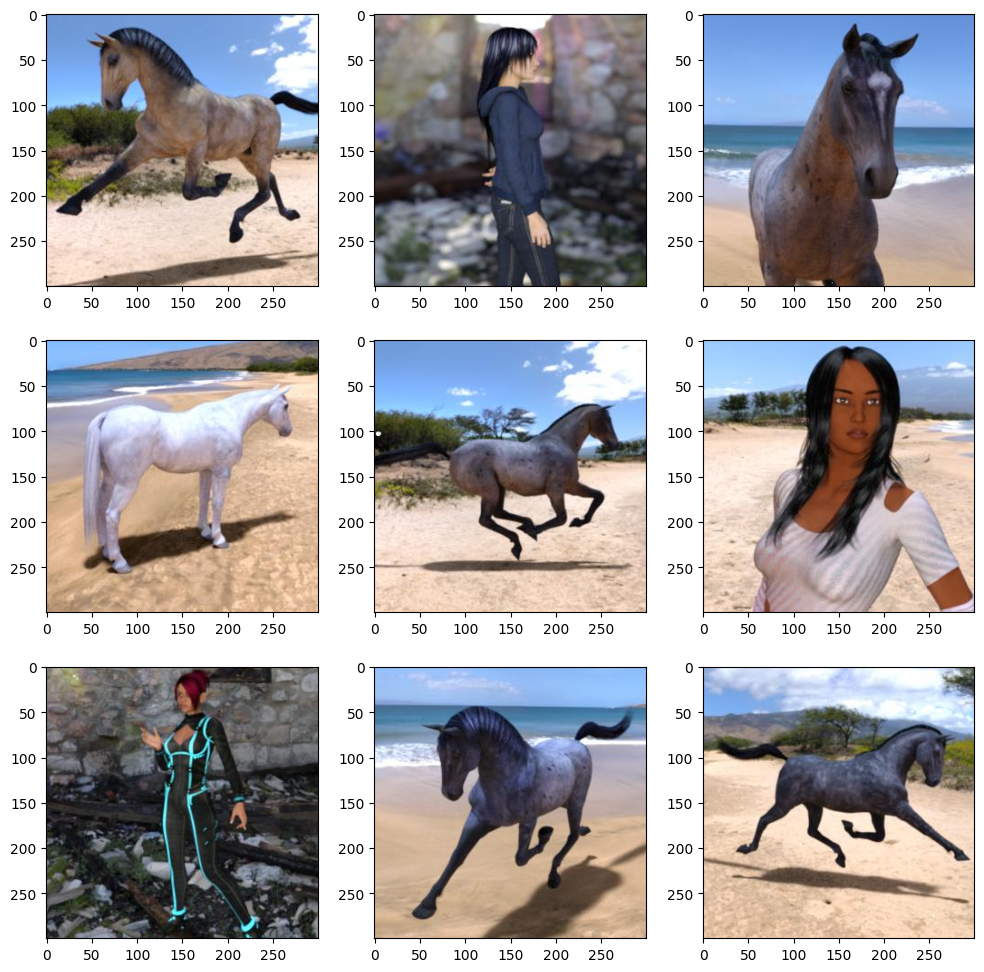

In [22]:
nrows = 3
ncols = 3

train_path = 'horse-or-human/train'
fig = plt.gcf()
fig.set_size_inches(ncols*4,nrows*4)
next_batch = train_generator.next()

for i in range(0,nrows*ncols):
  ax = plt.subplot(nrows,ncols, i+1)
  plt.imshow(next_batch[0][i])

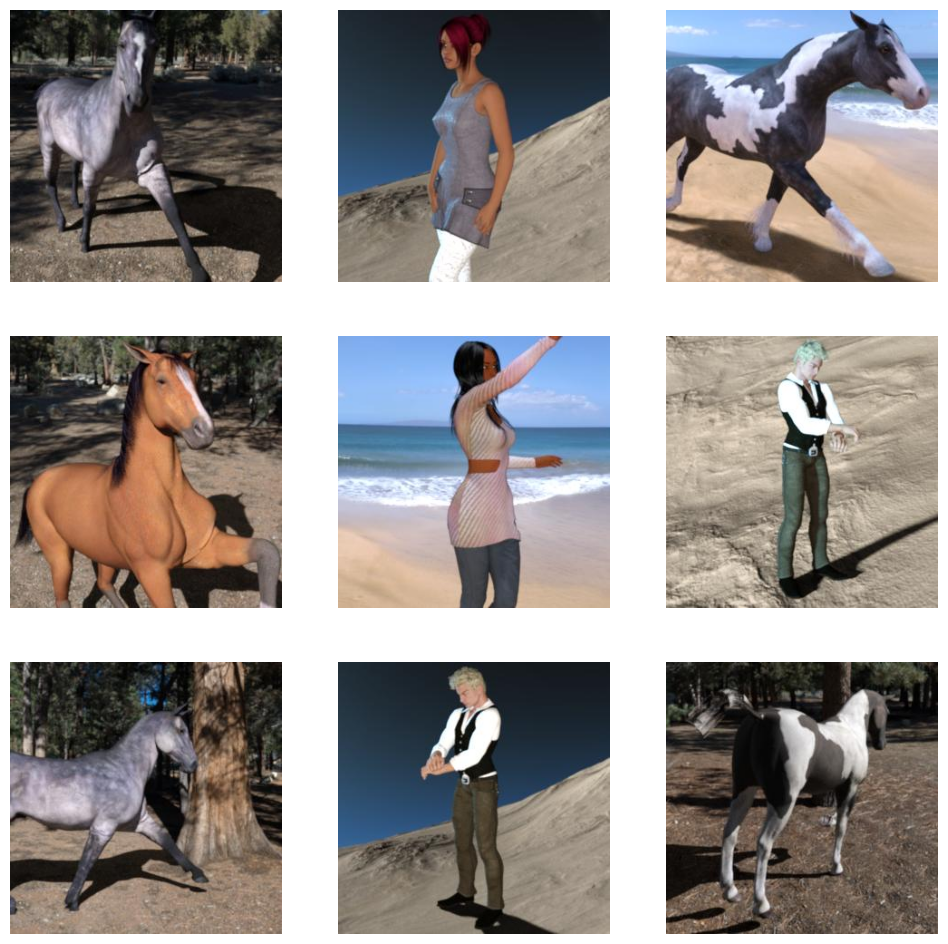

In [23]:
nrows = 3
ncols = 3

train_path = 'horse-or-human/train'
fig = plt.gcf()
fig.set_size_inches(ncols*4,nrows*4)

next_batch = train_generator.next()
for i in range(0,nrows*ncols):
  ax = plt.subplot(nrows,ncols, i+1)
  ax.axis('off')
  plt.imshow(next_batch[0][i])

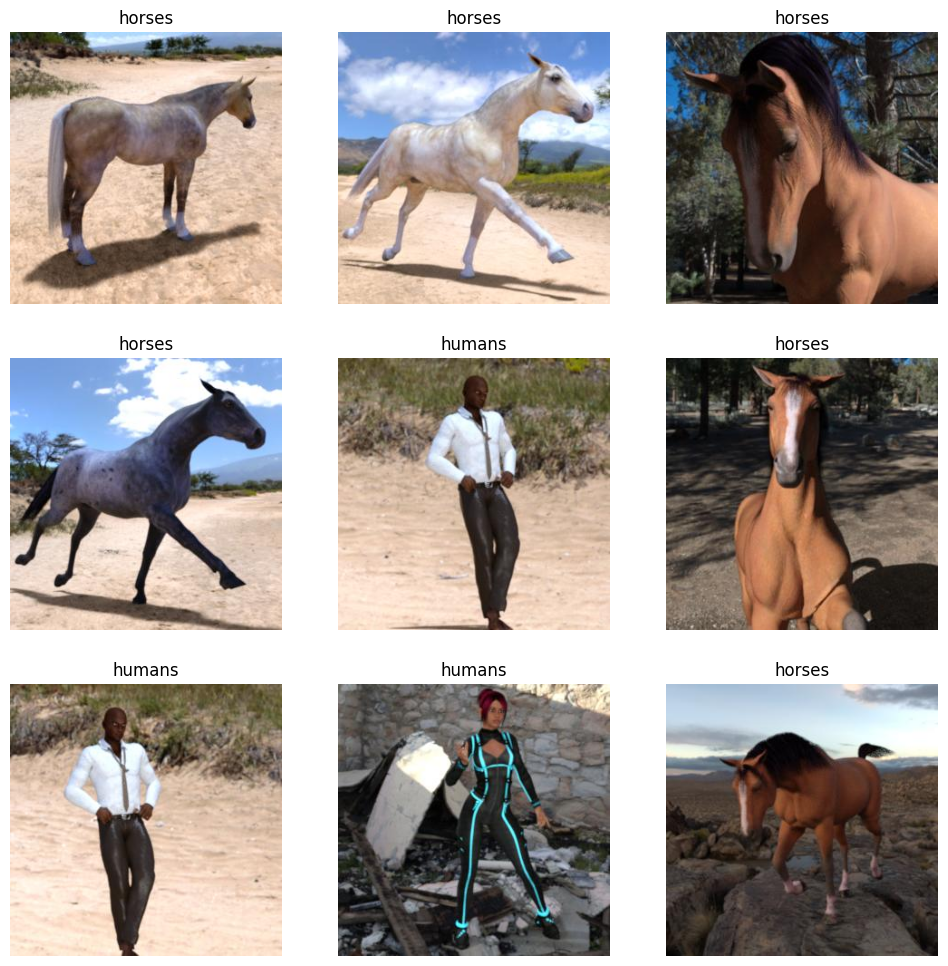

In [24]:
nrows = 3
ncols = 3

train_path = 'horse-or-human/train'
fig = plt.gcf()
fig.set_size_inches(ncols*4,nrows*4)

next_batch = train_generator.next()
for i in range(0,nrows*ncols):
  ax = plt.subplot(nrows,ncols, i+1)
  ax.axis('off')
  plt.imshow(next_batch[0][i])
  class_idx = next_batch[1][i]     # first value belong to be image and next value belong to the label
  plt.title(class_names[int(class_idx)])

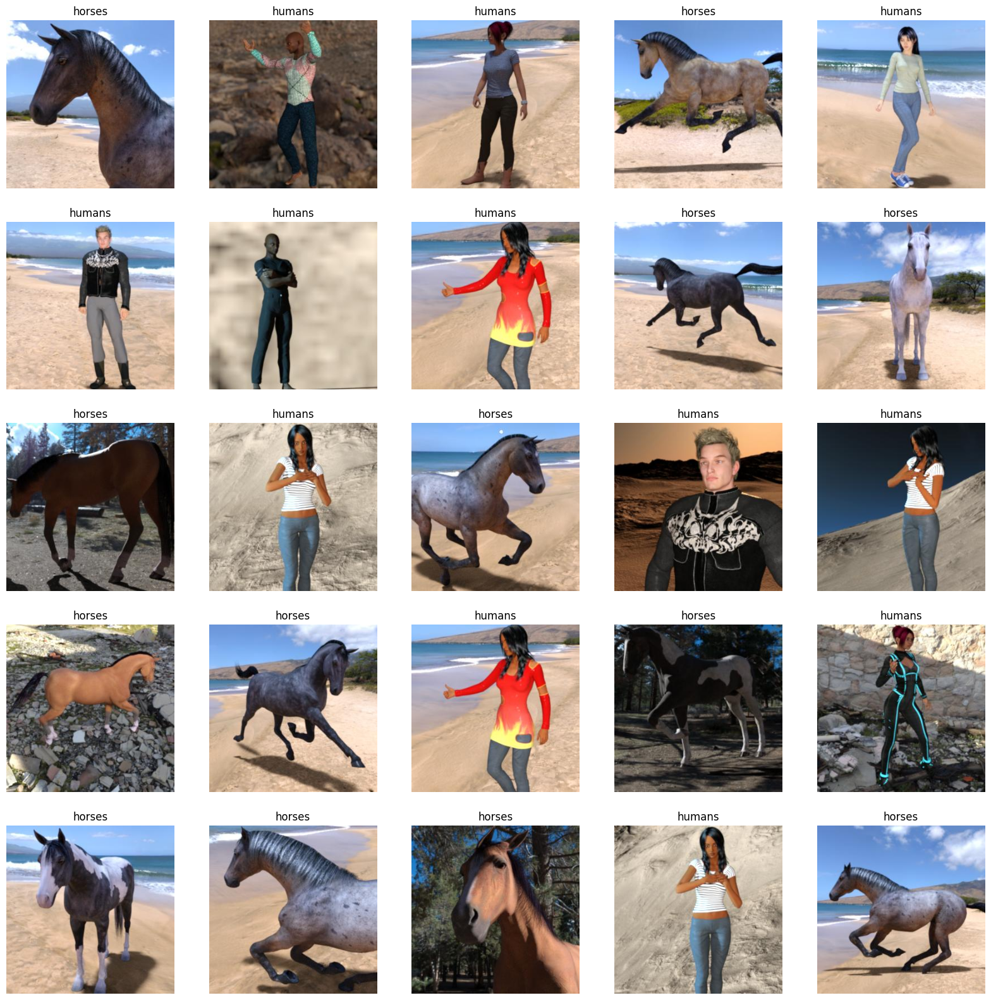

In [25]:
nrows = 5
ncols = 5

train_path = 'horse-or-human/train'
fig = plt.gcf()
fig.set_size_inches(ncols*4,nrows*4)

next_batch = train_generator.next()
for i in range(0,nrows*ncols):
  ax = plt.subplot(nrows,ncols, i+1)
  ax.axis('off')
  plt.imshow(next_batch[0][i])
  class_idx = next_batch[1][i]     # first value belong to be image and next value belong to the label
  plt.title(class_names[int(class_idx)])

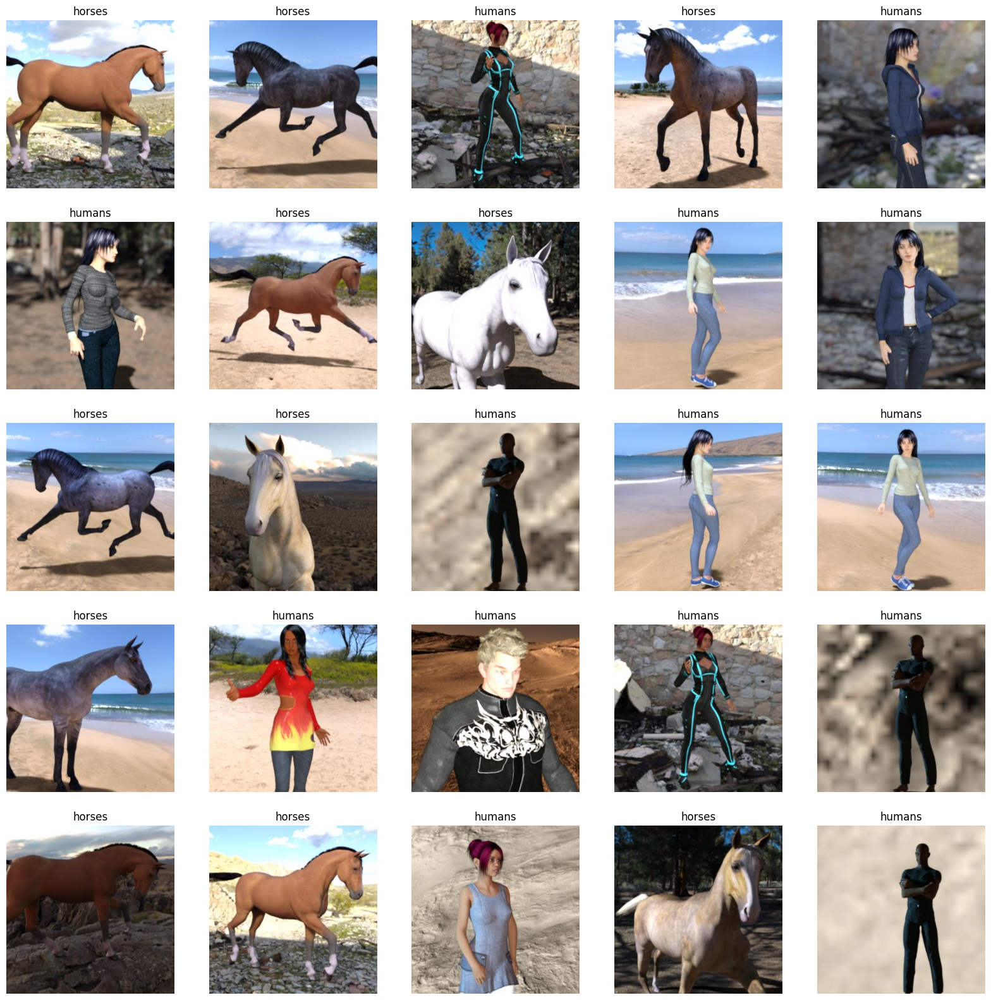

In [26]:
nrows = 5
ncols = 5

train_path = 'horse-or-human/train'
fig = plt.gcf()
fig.set_size_inches(ncols*4,nrows*4)

next_batch = train_generator.next()
for i in range(0,nrows*ncols):
  ax = plt.subplot(nrows,ncols, i+1)
  ax.axis('off')
  plt.imshow(next_batch[0][i])
  class_idx = next_batch[1][i]     # first value belong to be image and next value belong to the label
  plt.title(class_names[int(class_idx)])
plt.show()

### Building CNN Model

Important Parameter in CNN:

- Input_Shape: the shape of the input images. This is a 3-Tuple of integers, where the first two integers are the height and width of the image, and the third interger is the number of channels.
- filters: The number of filters to use the convolutional layer.
- kernel_size: An integer ot tuple/list of 2 integers, specifying the height and width of the 2D convolution window.
- strides: An integer or tuple/list of 2 integers, specifying the strides of the convolutional along the height and width.
- padding: One of 'valid' or 'same' (case-insesitive). 'valid' meanse no padding. 'same' result in padding evenly to the left/right or up/down of the input such that output has the same height/width dimension as the input.
- activation: activatio function to use. if we dont specify anything, no activation applied (i.e. "linear" activation: a(x)=x)
- pool_size: size of the max pooling windows.
- dropout: fraction of the input units to drop. Float between 0 and 1. Fraction of the input units to drop.

In [27]:
# import requred libraries
from tensorflow.keras.models import Model, Sequential
#from tensorflow.keras.Model import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import numpy as np
import tensorflow as tf

In [28]:
# defining the function
def get_model():
    model = Sequential()

    #1st layer CNN
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu', input_shape=(300,300,3)))
    #pooling layer hepls to reduce the number of parameters
    model.add(MaxPooling2D(pool_size=(5,5)))

    #2nd layer CNN
    model.add(Conv2D(filters=256, kernel_size=(3,3), activation='relu'))
    #pooling layer hepls to reduce the number of parameters
    model.add(MaxPooling2D(pool_size=(5,5)))

    #3nd layer CNN
    model.add(Conv2D(filters=512, kernel_size=(3,3), activation='relu'))
    #pooling layer hepls to reduce the number of parameters
    model.add(MaxPooling2D(pool_size=(3,3),strides=2))

     #4th layer CNN
    model.add(Conv2D(filters=512, kernel_size=(3,3), activation='relu'))

    #add flatten layer
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))

    #output layer  # we just have a single neuron   # or binary classification the activation function is sigmoid
    model.add(Dense(1,activation='sigmoid'))

    return model


In [29]:
model = get_model()

##### Analyse model/CNN parameter calculation

In [30]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 298, 298, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 59, 59, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 57, 57, 256)       295168    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 11, 11, 256)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 9, 9, 512)         1180160   
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 4, 4, 512)         0

# Calculate
- size of output layer for conv layer
- total number of parameter for conv layer
- output size after maxpool layer
- total parameter for dense layer

##### 1. size of output layer for conv layer

In [31]:
# size of output layer for conv layer (300,300,3) -> (None, 298, 298, 128)  How this happened?
# to get the output formula -> inputsize - (filter_size - 1)
300-(3-1), 300-(3-1), 128  # this is number of kernals/filters used to our conv layer   # thats how we can calculate output convulation layer

(298, 298, 128)

##### 2.total number of parameter for conv layer

In [32]:
# (n*k*k+1)*f ->  (channel in prev layer * filt_size * filt*size + 1 (bias term)) * filters in current layer
(3*3*3+1)*128   # total number of output comming

3584

In [33]:
# second conv layer ->  (None, 57, 57, 256)
(128*3*3+1)*256, (256*3*3+1)*512, (512*3*3+1)*512

(295168, 1180160, 2359808)

In [34]:
# Total param for dense layer (n+1)*m n=number of inputs, m=number of cells
(2048+1)*512

1049088

In [35]:
# output size after maxpool layer | floor ((w-f)/s+1) 10.9 -> 10, 10.1 -> 10
#298, 298 -> 59, 59
(298 - 5)/5 + 1

59.6

In [36]:
np.floor((298 - 5)/5 + 1)

59.0

### Model Training

In [37]:
model

###### we are going to analysis this model layer by layer

In [38]:
# list of te layers
model.layers

In [39]:
model.layers[0]  # getting first layer

In [40]:
model.layers[0].get_weights()  #

[array([[[[-0.05503314, -0.03630169, -0.02424181, ...,  0.02657463,
            0.01249561,  0.03559941],
          [-0.02574153,  0.00829202,  0.06179926, ...,  0.01835721,
            0.02934819, -0.01192409],
          [-0.02409114, -0.03511034,  0.04967014, ...,  0.03725036,
           -0.0224922 ,  0.06899017]],
 
         [[ 0.02011293,  0.02997424, -0.00372521, ...,  0.02341115,
            0.03557117,  0.02433123],
          [-0.06202045, -0.05822138,  0.02725065, ..., -0.03787389,
           -0.05468425,  0.02729421],
          [ 0.00614138, -0.0364872 , -0.01935181, ..., -0.04087813,
           -0.06791851, -0.06442674]],
 
         [[ 0.00464744,  0.05845611,  0.04920454, ...,  0.00328395,
            0.00288252, -0.00438041],
          [ 0.06415145, -0.06503841, -0.05687991, ..., -0.01142218,
            0.04933176, -0.06386857],
          [ 0.02197678,  0.06560376, -0.05064216, ..., -0.06123143,
           -0.05286581,  0.05915546]]],
 
 
        [[[ 0.0564747 , -0.038089 

In [41]:
# read weight and bies
weights,biases = model.layers[0].get_weights()

In [42]:
len(biases),len(weights),len(weights[0])

(128, 3, 3)

In [43]:
len(biases),len(weights[0][0][0])  # feature matrix

(128, 128)

In [44]:
model.layers[1]   # second layer maxpool layer

In [45]:
model.layers[1].get_weights()

[]

### Model Building

In [46]:
# compile the model
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
history = model.fit(train_generator,epochs=4,validation_data = test_generator)

Epoch 1/4
33/33 [==============================] - 15s 199ms/step - loss: 0.4977 - accuracy: 0.7663 - val_loss: 0.5970 - val_accuracy: 0.8125
Epoch 2/4
33/33 [==============================] - 5s 162ms/step - loss: 0.1964 - accuracy: 0.9260 - val_loss: 1.8445 - val_accuracy: 0.8320
Epoch 3/4
33/33 [==============================] - 5s 150ms/step - loss: 0.0760 - accuracy: 0.9747 - val_loss: 1.5392 - val_accuracy: 0.8594
Epoch 4/4
33/33 [==============================] - 5s 158ms/step - loss: 0.0289 - accuracy: 0.9912 - val_loss: 1.5128 - val_accuracy: 0.8750


In [47]:
history

In [48]:
history.history

{'loss': [0.49773603677749634,
  0.1964244395494461,
  0.0760437622666359,
  0.02893475629389286],
 'accuracy': [0.7663096189498901,
  0.9259980320930481,
  0.9746835231781006,
  0.9912366271018982],
 'val_loss': [0.5970246195793152,
  1.8444725275039673,
  1.5392080545425415,
  1.5127604007720947],
 'val_accuracy': [0.8125, 0.83203125, 0.859375, 0.875]}

### plot history data

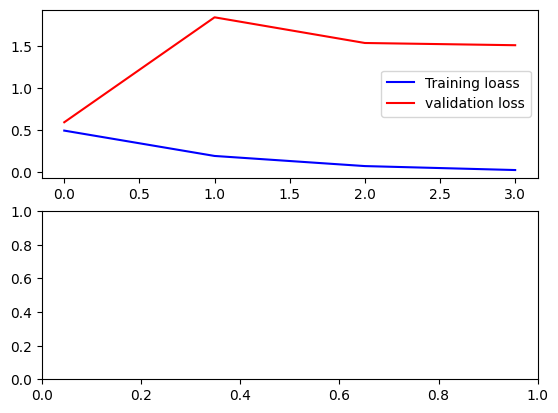

In [49]:
# plot taining history
fix, ax = plt.subplots(2,1)

ax[0].plot(history.history['loss'], color='b', label='Training loass')
ax[0].plot(history.history['val_loss'], color='r', label='validation loss')
ax[0].legend()

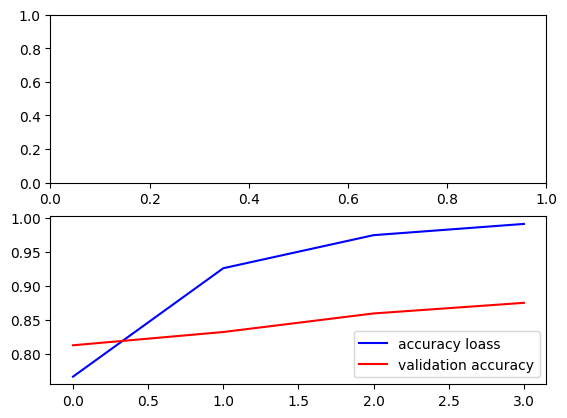

In [50]:
# accuracy ploting
fix, ax = plt.subplots(2,1)
ax[1].plot(history.history['accuracy'], color='b', label='accuracy loass')
ax[1].plot(history.history['val_accuracy'], color='r', label='validation accuracy')
ax[1].legend()

In [51]:
# save the model
model.save('horse-or-human.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [53]:
# load model
from tensorflow.keras.models import load_model
model_load = load_model('horse-or-human.h5')

**Prediction**

In [54]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image


In [55]:
model_load = load_model('horse-or-human.h5')

In [58]:
img = image.load_img('/content/horse-or-human/test/horses/horses-102.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img

array([[[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       ...,

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 2

In [59]:
img = image.load_img('/content/horse-or-human/test/horses/horses-102.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # it converts 3 dimention to 4 dimention
img

array([[[[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        ...,

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
       

In [60]:
img = image.load_img('/content/horse-or-human/test/horses/horses-102.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # it converts 3 dimention to 4 dimention
img = img/255
img

array([[[[1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.],
         ...,
         [1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.]],

        [[1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.],
         ...,
         [1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.]],

        [[1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.],
         ...,
         [1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.]],

        ...,

        [[1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.],
         ...,
         [1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.]],

        [[1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.],
         ...,
         [1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.]],

        [[1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.],
         ...,
         [1., 1., 1.],
         [1., 1., 1.],
         [1., 1., 1.]]]], dtype=float32)

In [61]:
img = image.load_img('/content/horse-or-human/test/horses/horses-102.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # it converts 3 dimention to 4 dimention
img = img/255

prediction = model_load(img)
print(prediction)

tf.Tensor([[0.05977521]], shape=(1, 1), dtype=float32)


In [62]:
img = image.load_img('/content/horse-or-human/test/horses/horses-102.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # it converts 3 dimention to 4 dimention
img = img/255

prediction = model_load(img)
print(prediction)

# defining the threshold
TH = 0.5
predicted_class = int(prediction[0][0]>TH)
predicted_class

tf.Tensor([[0.05977521]], shape=(1, 1), dtype=float32)


0

In [63]:
class_names

['horses', 'humans']

In [64]:
class_indices = train_generator.class_indices
class_indices

{'horses': 0, 'humans': 1}

In [65]:
class_indices = train_generator.class_indices
labels = {v:k for k,v in class_indices.items()}
labels

{0: 'horses', 1: 'humans'}

horse image prediction

In [67]:
img = image.load_img('/content/horse-or-human/test/horses/horses-102.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # it converts 3 dimention to 4 dimention
img = img/255

prediction = model_load(img)
print(prediction)

# defining the threshold
TH = 0.5
predicted_class = int(prediction[0][0]>TH)
class_indices = train_generator.class_indices
labels = {v:k for k,v in class_indices.items()}
print("The image if of a: ", labels[predicted_class])

tf.Tensor([[0.05977521]], shape=(1, 1), dtype=float32)
The image if of a:  horses


human image prediction

In [68]:
img = image.load_img('/content/horse-or-human/test/humans/humans-110.jpg',target_size=(300,300))
#coverting image into array
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # it converts 3 dimention to 4 dimention
img = img/255

prediction = model_load(img)
print(prediction)

# defining the threshold
TH = 0.5
predicted_class = int(prediction[0][0]>TH)
class_indices = train_generator.class_indices
labels = {v:k for k,v in class_indices.items()}
print("The image if of a: ", labels[predicted_class])

tf.Tensor([[1.]], shape=(1, 1), dtype=float32)
The image if of a:  humans
